In [10]:
# Default libraries
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
import torch.optim as optim
import torchvision

class PredictiveDiffusionModule(nn.Module):
    def __init__(self, output_shape, conditioner_size=1024, num_diffusion_steps=10):
        super(PredictiveDiffusionModule, self).__init__()
        self.output_shape = output_shape  # Expected output shape, e.g., (batch_size, C, H, W)
        self.conditioner_size = conditioner_size
        self.num_diffusion_steps = num_diffusion_steps
        
        self.initial_conditioner_transform = nn.Linear(conditioner_size, output_shape[1] * output_shape[2] * output_shape[3])
        
        self.diffusion_blocks = nn.ModuleList([
            nn.Sequential(
                nn.Conv2d(output_shape[1], output_shape[1], kernel_size=3, padding=1, bias=False),
                nn.BatchNorm2d(output_shape[1]),
                nn.ReLU(inplace=True)
            ) for _ in range(num_diffusion_steps)
        ])
        
        # Final layer to adjust the conditioner influence on the generated patch
        self.final_conditioner_adjust = nn.Conv2d(output_shape[1], output_shape[1], kernel_size=1)

       


    def forward(self, conditioner):
        # Generate initial random noise
        batch_size = conditioner.size(0)
        x = torch.randn((batch_size,) + self.output_shape[1:], device=conditioner.device)
        
        conditioner_transformed = self.initial_conditioner_transform(conditioner)
        conditioner_transformed = conditioner_transformed.view(batch_size, self.output_shape[1], self.output_shape[2], self.output_shape[3])
        
        for step in range(self.num_diffusion_steps):
            x = self.diffusion_blocks[step](x + conditioner_transformed)
        
        # Final adjustment using the conditioner
        x = self.final_conditioner_adjust(x)
        # x = self.diffusion_reconstruction(x)
        
        return x

class ReversedEntropy(nn.Module): 
    def __init__(self):
        super(ReversedEntropy, self).__init__()
        # conditioner to reduce image to 4096 feature vector
        self.img_conditioner = nn.Sequential(
            nn.Conv2d(3, 3, stride=4, kernel_size=4,  groups=3),
            nn.ReLU(),
            nn.Conv2d(3, 3, stride=2, kernel_size=4, groups=3),
            nn.ReLU(),
        )
        self.linear_embedding = nn.Sequential(
            nn.Linear(11907, 4096),
            nn.ReLU()
        )

        self.diffusion_module = PredictiveDiffusionModule(output_shape=(1, 3, 512, 512), conditioner_size=4096, num_diffusion_steps=10)

    def forward(self, img):
        img = img.permute(0, 3, 1, 2)
        conditioner = self.img_conditioner(img)
        conditioner = conditioner.reshape(conditioner.size(0), -1)
        # print(conditioner.shape)
        conditioner = self.linear_embedding(conditioner)
        
        img = self.diffusion_module(conditioner)
        img = img.permute(0, 2, 3, 1)
        img = F.sigmoid(img)
        return img



In [11]:
model = ReversedEntropy().cuda()
optimizer = optim.Adam(model.parameters(), lr=0.01)


In [12]:
# open file ./timg.jpg as numpy vector and normalize between 0-1
import imageio.v3 as iio
img_sample = (torch.Tensor(iio.imread("~/dca571a8bf7dbd44f061e1fc7c5f1f80.jpg", mode='RGB'))/255.0).unsqueeze(0).cuda()

Epoch=  0 Loss=  0.06310560554265976


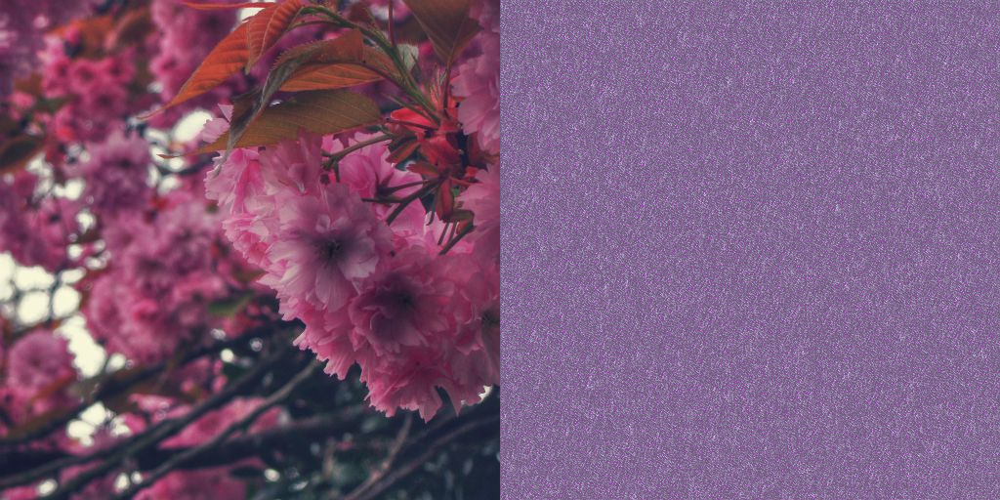

Epoch=  1 Loss=  0.05832131206989288
Epoch=  2 Loss=  0.0484609380364418
Epoch=  3 Loss=  0.042086970061063766
Epoch=  4 Loss=  0.03746737539768219
Epoch=  5 Loss=  0.03398770093917847
Epoch=  6 Loss=  0.03136196359992027
Epoch=  7 Loss=  0.029380273073911667
Epoch=  8 Loss=  0.027841221541166306
Epoch=  9 Loss=  0.02657860517501831
Epoch=  10 Loss=  0.0254860520362854
Epoch=  11 Loss=  0.02450362965464592
Epoch=  12 Loss=  0.023601634427905083
Epoch=  13 Loss=  0.022762998938560486
Epoch=  14 Loss=  0.021979978308081627
Epoch=  15 Loss=  0.02124847285449505
Epoch=  16 Loss=  0.02056850492954254
Epoch=  17 Loss=  0.019940007477998734
Epoch=  18 Loss=  0.019362252205610275
Epoch=  19 Loss=  0.018829818814992905
Epoch=  20 Loss=  0.01833573542535305
Epoch=  21 Loss=  0.017871230840682983
Epoch=  22 Loss=  0.01742805354297161
Epoch=  23 Loss=  0.016999345272779465
Epoch=  24 Loss=  0.016579460352659225
Epoch=  25 Loss=  0.01616489142179489
Epoch=  26 Loss=  0.015753626823425293
Epoch=  27

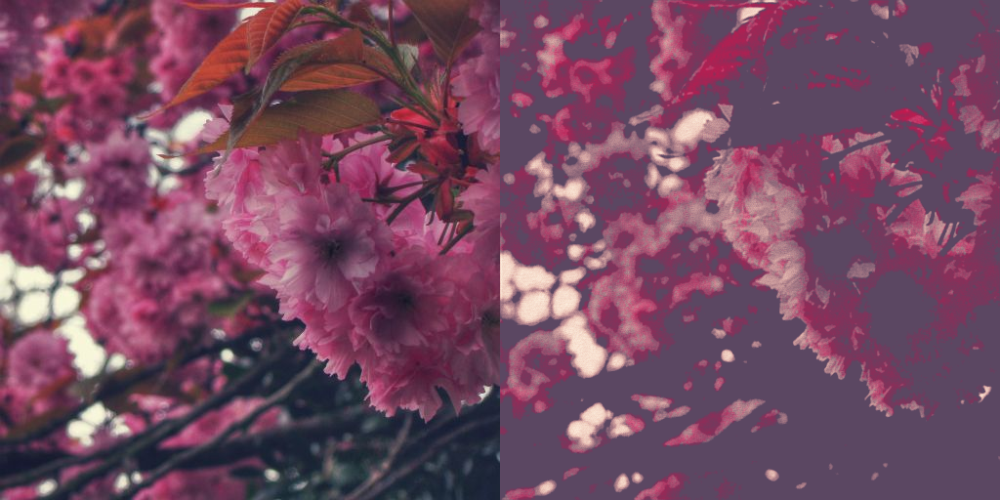

Epoch=  51 Loss=  0.008459646254777908
Epoch=  52 Loss=  0.008283430710434914
Epoch=  53 Loss=  0.008113480173051357
Epoch=  54 Loss=  0.007949515245854855
Epoch=  55 Loss=  0.007791207637637854
Epoch=  56 Loss=  0.0076382658444345
Epoch=  57 Loss=  0.007490447722375393
Epoch=  58 Loss=  0.007347465958446264
Epoch=  59 Loss=  0.007209032773971558
Epoch=  60 Loss=  0.007074984721839428
Epoch=  61 Loss=  0.00694521889090538
Epoch=  62 Loss=  0.006819620728492737
Epoch=  63 Loss=  0.006698091980069876
Epoch=  64 Loss=  0.006580600515007973
Epoch=  65 Loss=  0.006466969847679138
Epoch=  66 Loss=  0.006357159465551376
Epoch=  67 Loss=  0.006251039914786816
Epoch=  68 Loss=  0.006148547865450382
Epoch=  69 Loss=  0.0060494705103337765
Epoch=  70 Loss=  0.005953680258244276
Epoch=  71 Loss=  0.00586099736392498
Epoch=  72 Loss=  0.005771280732005835
Epoch=  73 Loss=  0.00568433478474617
Epoch=  74 Loss=  0.005600030533969402
Epoch=  75 Loss=  0.005518221762031317
Epoch=  76 Loss=  0.005438745

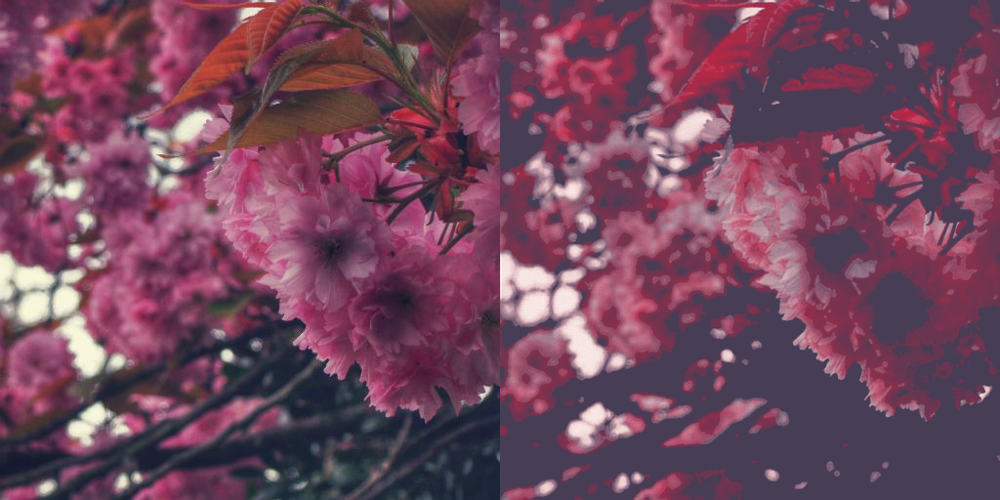

Epoch=  101 Loss=  0.003998324275016785
Epoch=  102 Loss=  0.0039562685415148735
Epoch=  103 Loss=  0.003915059380233288
Epoch=  104 Loss=  0.0038747009821236134
Epoch=  105 Loss=  0.0038351337425410748
Epoch=  106 Loss=  0.0037963283248245716
Epoch=  107 Loss=  0.0037582842633128166
Epoch=  108 Loss=  0.0037210143636912107
Epoch=  109 Loss=  0.0036844657734036446
Epoch=  110 Loss=  0.003648639190942049
Epoch=  111 Loss=  0.0036135069094598293
Epoch=  112 Loss=  0.0035790391266345978
Epoch=  113 Loss=  0.0035452148877084255
Epoch=  114 Loss=  0.003512053517624736
Epoch=  115 Loss=  0.0034795282408595085
Epoch=  116 Loss=  0.0034476188011467457
Epoch=  117 Loss=  0.003416305873543024
Epoch=  118 Loss=  0.0033855829387903214
Epoch=  119 Loss=  0.003355406690388918
Epoch=  120 Loss=  0.003325776197016239
Epoch=  121 Loss=  0.003296672133728862
Epoch=  122 Loss=  0.0032681215088814497
Epoch=  123 Loss=  0.0032401024363934994
Epoch=  124 Loss=  0.003212563693523407
Epoch=  125 Loss=  0.0031

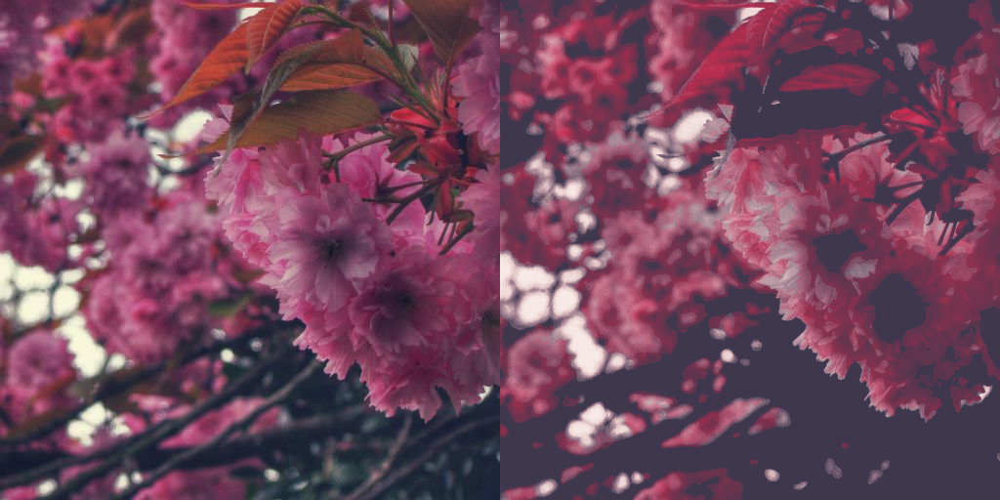

Epoch=  151 Loss=  0.0026232991367578506
Epoch=  152 Loss=  0.0026061884127557278
Epoch=  153 Loss=  0.0025893491692841053
Epoch=  154 Loss=  0.002572768833488226
Epoch=  155 Loss=  0.002556419698521495
Epoch=  156 Loss=  0.002540290355682373
Epoch=  157 Loss=  0.00252438522875309
Epoch=  158 Loss=  0.0025087054818868637
Epoch=  159 Loss=  0.002493248786777258
Epoch=  160 Loss=  0.002478016307577491
Epoch=  161 Loss=  0.002463018987327814
Epoch=  162 Loss=  0.0024482659064233303
Epoch=  163 Loss=  0.0024337689392268658
Epoch=  164 Loss=  0.002419503638520837
Epoch=  165 Loss=  0.0024054842069745064
Epoch=  166 Loss=  0.0023916619829833508
Epoch=  167 Loss=  0.002378038829192519
Epoch=  168 Loss=  0.0023646228946745396
Epoch=  169 Loss=  0.002351394621655345
Epoch=  170 Loss=  0.002338342135772109
Epoch=  171 Loss=  0.00232546404004097
Epoch=  172 Loss=  0.002312761265784502
Epoch=  173 Loss=  0.002300220774486661
Epoch=  174 Loss=  0.0022878306917846203
Epoch=  175 Loss=  0.00227560475

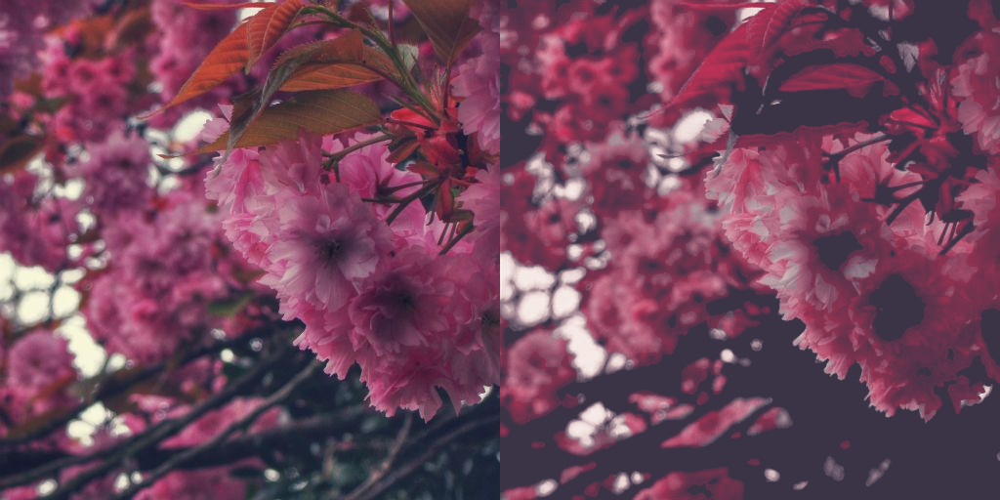

Epoch=  201 Loss=  0.0020065687131136656
Epoch=  202 Loss=  0.0019978522323071957
Epoch=  203 Loss=  0.001989244483411312
Epoch=  204 Loss=  0.001980759669095278
Epoch=  205 Loss=  0.001972411759197712
Epoch=  206 Loss=  0.0019641511607915163
Epoch=  207 Loss=  0.001955992542207241
Epoch=  208 Loss=  0.0019479335751384497
Epoch=  209 Loss=  0.0019399472512304783
Epoch=  210 Loss=  0.0019320219289511442
Epoch=  211 Loss=  0.0019241699483245611
Epoch=  212 Loss=  0.001916381879709661
Epoch=  213 Loss=  0.0019086739048361778
Epoch=  214 Loss=  0.001901040319353342
Epoch=  215 Loss=  0.0018935002153739333
Epoch=  216 Loss=  0.0018860375275835395
Epoch=  217 Loss=  0.0018786555156111717
Epoch=  218 Loss=  0.0018713218159973621
Epoch=  219 Loss=  0.0018640672788023949
Epoch=  220 Loss=  0.0018568591913208365
Epoch=  221 Loss=  0.001849679509177804
Epoch=  222 Loss=  0.0018425534944981337
Epoch=  223 Loss=  0.001835530623793602
Epoch=  224 Loss=  0.0018285949481651187
Epoch=  225 Loss=  0.001

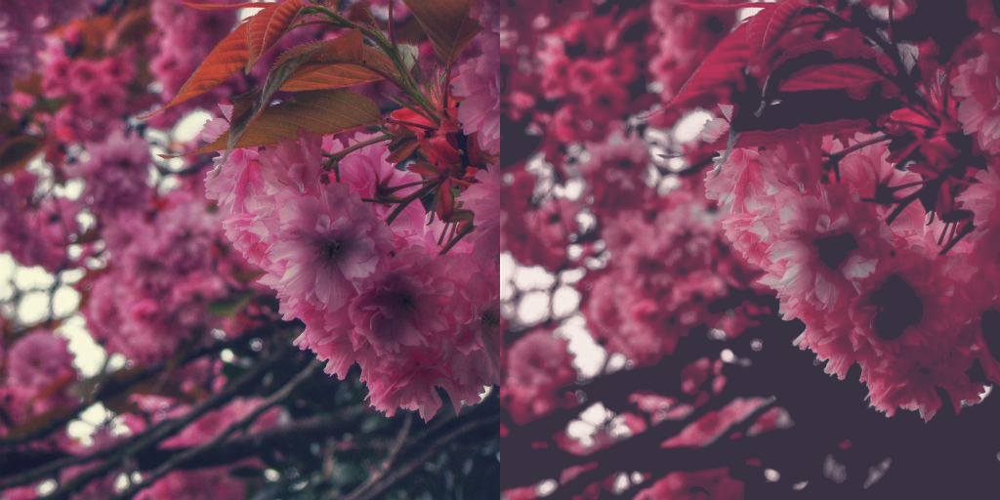

Epoch=  251 Loss=  0.0016643682029098272
Epoch=  252 Loss=  0.0016590338200330734
Epoch=  253 Loss=  0.0016537292394787073
Epoch=  254 Loss=  0.0016484353691339493
Epoch=  255 Loss=  0.001643163850530982
Epoch=  256 Loss=  0.001637923065572977
Epoch=  257 Loss=  0.0016327298944815993
Epoch=  258 Loss=  0.0016275470843538642
Epoch=  259 Loss=  0.0016223627608269453
Epoch=  260 Loss=  0.0016172113828361034
Epoch=  261 Loss=  0.0016121140215545893
Epoch=  262 Loss=  0.0016070639248937368
Epoch=  263 Loss=  0.0016020536422729492
Epoch=  264 Loss=  0.0015971012180671096
Epoch=  265 Loss=  0.001592181040905416
Epoch=  266 Loss=  0.001587273320183158
Epoch=  267 Loss=  0.0015823978465050459
Epoch=  268 Loss=  0.001577545888721943
Epoch=  269 Loss=  0.0015727047575637698
Epoch=  270 Loss=  0.0015678938943892717
Epoch=  271 Loss=  0.0015631233109161258
Epoch=  272 Loss=  0.001558396965265274
Epoch=  273 Loss=  0.0015537048457190394
Epoch=  274 Loss=  0.0015490393852815032
Epoch=  275 Loss=  0.0

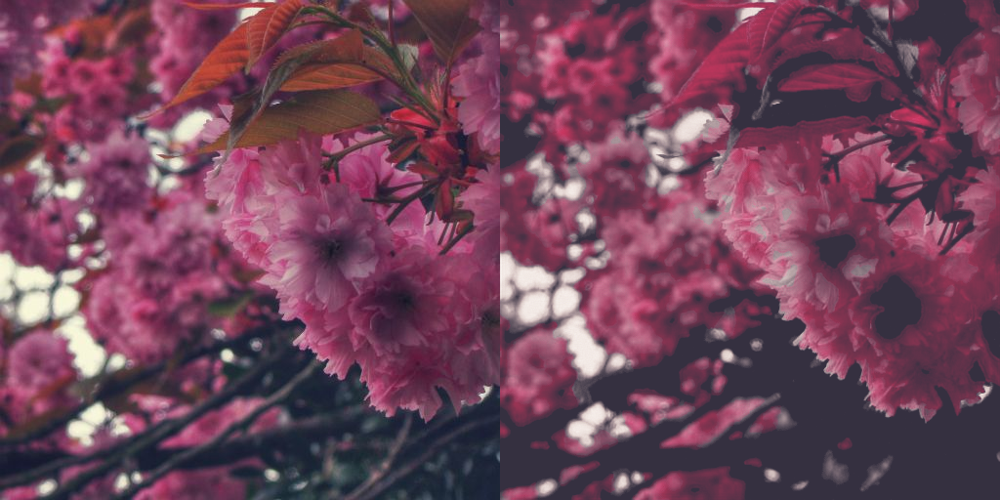

Epoch=  301 Loss=  0.0014319652691483498
Epoch=  302 Loss=  0.0014278017915785313
Epoch=  303 Loss=  0.0014236250426620245
Epoch=  304 Loss=  0.0014194345567375422
Epoch=  305 Loss=  0.0014152306830510497
Epoch=  306 Loss=  0.0014110037591308355
Epoch=  307 Loss=  0.001406781724654138
Epoch=  308 Loss=  0.001402541995048523
Epoch=  309 Loss=  0.0013982753735035658
Epoch=  310 Loss=  0.001394007122144103
Epoch=  311 Loss=  0.001389739802107215
Epoch=  312 Loss=  0.0013854699209332466
Epoch=  313 Loss=  0.0013811774551868439
Epoch=  314 Loss=  0.001376855536364019
Epoch=  315 Loss=  0.0013724922901019454
Epoch=  316 Loss=  0.0013680619886144996
Epoch=  317 Loss=  0.0013635200448334217
Epoch=  318 Loss=  0.001358901965431869
Epoch=  319 Loss=  0.0013541982043534517
Epoch=  320 Loss=  0.0013493959559127688
Epoch=  321 Loss=  0.0013444945216178894
Epoch=  322 Loss=  0.001339498208835721
Epoch=  323 Loss=  0.0013344212202355266
Epoch=  324 Loss=  0.0013292590156197548
Epoch=  325 Loss=  0.00

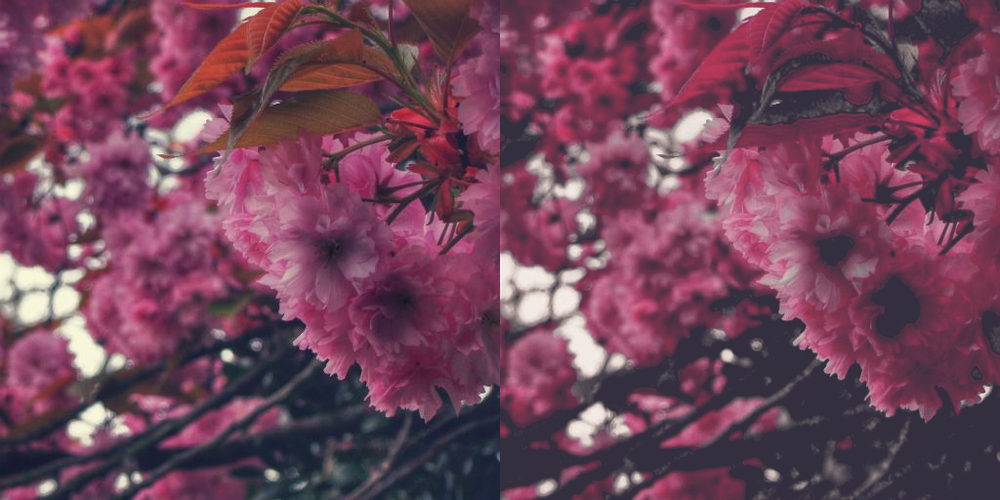

Epoch=  351 Loss=  0.0011084495345130563
Epoch=  352 Loss=  0.0011010980233550072
Epoch=  353 Loss=  0.001094252336770296
Epoch=  354 Loss=  0.0010877973400056362
Epoch=  355 Loss=  0.001081653987057507
Epoch=  356 Loss=  0.001075740554369986
Epoch=  357 Loss=  0.001070002792403102
Epoch=  358 Loss=  0.001064395415596664
Epoch=  359 Loss=  0.0010588819859549403
Epoch=  360 Loss=  0.001053450396284461
Epoch=  361 Loss=  0.001048100646585226
Epoch=  362 Loss=  0.0010428456589579582
Epoch=  363 Loss=  0.001037693815305829
Epoch=  364 Loss=  0.0010326446499675512
Epoch=  365 Loss=  0.001027709455229342
Epoch=  366 Loss=  0.0010228934697806835
Epoch=  367 Loss=  0.0010181849356740713
Epoch=  368 Loss=  0.0010135703487321734
Epoch=  369 Loss=  0.0010090507566928864
Epoch=  370 Loss=  0.0010046233655884862
Epoch=  371 Loss=  0.0010002858471125364
Epoch=  372 Loss=  0.0009960259776562452
Epoch=  373 Loss=  0.0009918354917317629
Epoch=  374 Loss=  0.0009877176489681005
Epoch=  375 Loss=  0.0009

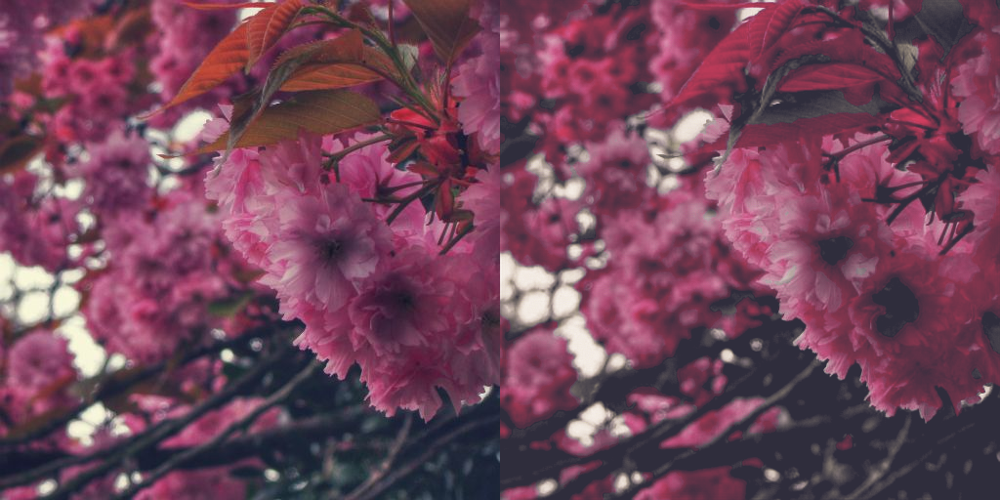

Epoch=  401 Loss=  0.0008940385887399316
Epoch=  402 Loss=  0.0008910720935091376
Epoch=  403 Loss=  0.000888132955878973
Epoch=  404 Loss=  0.0008852194878272712
Epoch=  405 Loss=  0.0008823336102068424
Epoch=  406 Loss=  0.0008794798050075769
Epoch=  407 Loss=  0.0008766553364694118
Epoch=  408 Loss=  0.0008738533360883594
Epoch=  409 Loss=  0.0008710772963240743
Epoch=  410 Loss=  0.0008683283231221139
Epoch=  411 Loss=  0.0008656069985590875
Epoch=  412 Loss=  0.0008629115181975067
Epoch=  413 Loss=  0.0008602418238297105
Epoch=  414 Loss=  0.0008575950632803142
Epoch=  415 Loss=  0.0008549715275876224
Epoch=  416 Loss=  0.0008523697033524513
Epoch=  417 Loss=  0.0008497891249135137
Epoch=  418 Loss=  0.0008472278714179993
Epoch=  419 Loss=  0.0008446867577731609
Epoch=  420 Loss=  0.0008421693928539753
Epoch=  421 Loss=  0.0008396714692935348
Epoch=  422 Loss=  0.0008371893782168627
Epoch=  423 Loss=  0.0008347250404767692
Epoch=  424 Loss=  0.0008322770590893924
Epoch=  425 Loss=

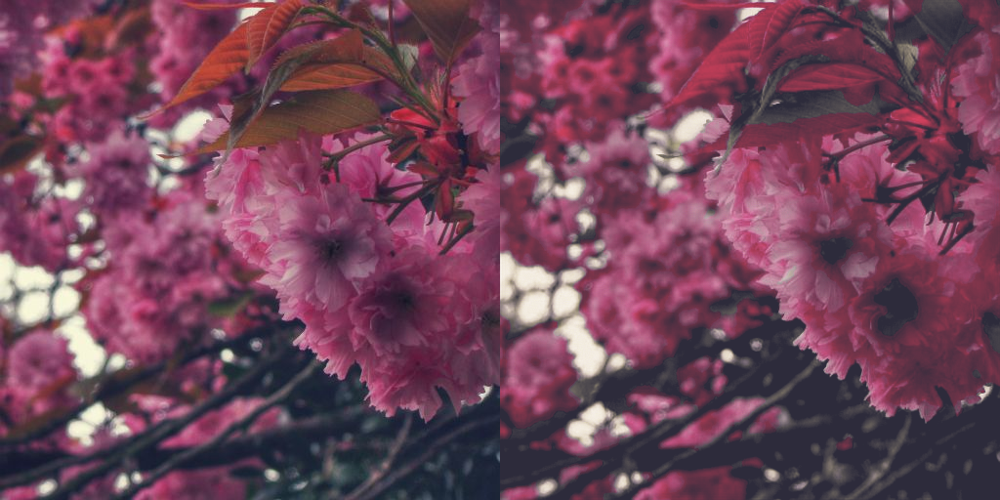

Epoch=  451 Loss=  0.0007717999396845698
Epoch=  452 Loss=  0.0007697505643591285
Epoch=  453 Loss=  0.000767712714150548
Epoch=  454 Loss=  0.0007656847592443228
Epoch=  455 Loss=  0.0007636664668098092
Epoch=  456 Loss=  0.0007616565562784672
Epoch=  457 Loss=  0.000759652117267251
Epoch=  458 Loss=  0.0007576518692076206
Epoch=  459 Loss=  0.0007556552882306278
Epoch=  460 Loss=  0.0007536645862273872
Epoch=  461 Loss=  0.0007516829064115882
Epoch=  462 Loss=  0.0007497069891542196
Epoch=  463 Loss=  0.0007477401522919536
Epoch=  464 Loss=  0.0007457800093106925
Epoch=  465 Loss=  0.0007438274915330112
Epoch=  466 Loss=  0.0007418825989589095
Epoch=  467 Loss=  0.0007399438763968647
Epoch=  468 Loss=  0.000738014467060566
Epoch=  469 Loss=  0.0007360921590588987
Epoch=  470 Loss=  0.0007341759046539664
Epoch=  471 Loss=  0.0007322663441300392
Epoch=  472 Loss=  0.0007303616730496287
Epoch=  473 Loss=  0.0007284629973582923
Epoch=  474 Loss=  0.0007265654276125133
Epoch=  475 Loss=  

KeyboardInterrupt: 

In [13]:
import IPython.display as ipd
from PIL import Image
for i in range(1000):
    optimizer.zero_grad()
    output= model(img_sample)
    loss =  F.mse_loss(output, img_sample)
    loss.backward()
    print("Epoch= ", i,"Loss= ", loss.item())
    if( i % 50 == 0):
        joined_img = torch.cat([img_sample, output], dim=2).squeeze(0)
        img = Image.fromarray(((joined_img ) * 255.0 ).cpu().detach().numpy().astype(np.uint8), 'RGB')
        ipd.display(img)
    optimizer.step()

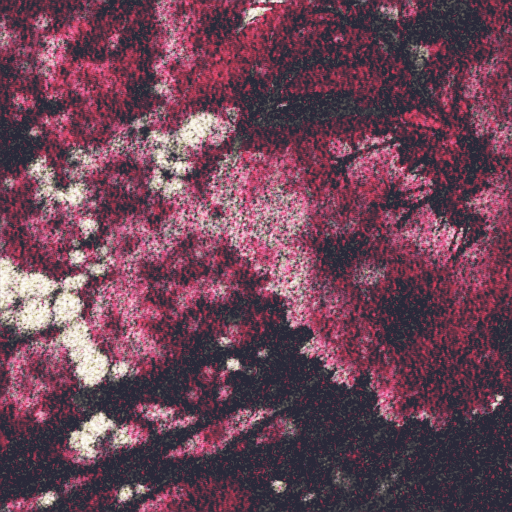

In [14]:
sample_conditioner=  F.relu(torch.randn(1, 4096).cuda())
img = model.diffusion_module(sample_conditioner)
img = img.permute(0, 2, 3, 1)
img = F.sigmoid(img)
image = Image.fromarray((img.squeeze(0) * 255.0).cpu().detach().numpy().astype(np.uint8), 'RGB')
ipd.display(image)